In [28]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import sys
import os
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from IPython.display import HTML
from hexapod_biomechanics.load_data import C3DMan
from hexapod_biomechanics.forces import HexKistler
from hexapod_biomechanics.visualize import animate_grf
from hexapod_force_modeling.mlp_model import BasicMLP
from hexapod_biomechanics.utils import get_body_mass

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Load Data

### Init C3D Manageres and Print Labels

In [30]:
static_file = "../data/C0111085/11082025/static_01.c3d"
# trip_file = "../data/C0111085/11082025/hex250811101244_trip1_nom_fwd.c3d"
trip_file = "../data/C0111085/11082025/hex250811101244_trip2_pert_50pct_rev.c3d"
# trip_file = "../data/C0111085/11082025/hex250811101244_trip3_pert_50pct_fwd.c3d"

Static = C3DMan(static_file)
Trip = C3DMan(trip_file)

Static.print_data_labels()

C3D file opened from path: ../data/C0111085/11082025/static_01.c3d
C3D file opened from path: ../data/C0111085/11082025/hex250811101244_trip2_pert_50pct_rev.c3d
---------- ANALOG CHANNELS ----------
('Bertec Force Plate [1]', 'Force.Fx1')
('Bertec Force Plate [1]', 'Force.Fy1')
('Bertec Force Plate [1]', 'Force.Fz1')
('Bertec Force Plate [1]', 'Moment.Mx1')
('Bertec Force Plate [1]', 'Moment.My1')
('Bertec Force Plate [1]', 'Moment.Mz1')
('Bertec Force Plate [2]', 'Force.Fx2')
('Bertec Force Plate [2]', 'Force.Fy2')
('Bertec Force Plate [2]', 'Force.Fz2')
('Bertec Force Plate [2]', 'Moment.Mx2')
('Bertec Force Plate [2]', 'Moment.My2')
('Bertec Force Plate [2]', 'Moment.Mz2')
('AMTI 400600     [37]', 'Force.Fx3')
('AMTI 400600     [37]', 'Force.Fy3')
('AMTI 400600     [37]', 'Force.Fz3')
('AMTI 400600     [37]', 'Moment.Mx3')
('AMTI 400600     [37]', 'Moment.My3')
('AMTI 400600     [37]', 'Moment.Mz3')
('AMTI 400600     [38]', 'Force.Fx4')
('AMTI 400600     [38]', 'Force.Fy4')
('AMTI 4

### Extract Marker Data

In [22]:
hex_marker_labels = [
    'hexapod:Hexapod00',
    'hexapod:Hexapod10',
    'hexapod:Hexapod11'
]

bio_marker_labels = [
    "C0111085:RMANK", # right medial malleolus
    "C0111085:LMANK", # left medial malleolus
    "C0111085:RANK", # right lateral malleolus
    "C0111085:LANK", # left lateral malleolus
    "C0111085:RMKNE", # right medial condyle
    "C0111085:LMKNE", # left medial condyle
    "C0111085:RKNE", # right lateral condyle
    "C0111085:LKNE", # left lateral condyle
    "C0111085:RTIBA", # right shank cluster 1
    "C0111085:RTIBB", # right shank cluster 2
    "C0111085:RTIBC", # right shank cluster 3
    "C0111085:LTIBA", # left shank cluster 1
    "C0111085:LTIBB", # left shank cluster 2
    "C0111085:LTIBC", # left shank cluster 3
    "C0111085:RHEE", # right foot cluster 1
    "C0111085:RMT1", # right foot cluster 2
    "C0111085:RMT5", # right foot cluster 3
    "C0111085:LHEE", # left foot cluster 1
    "C0111085:LMT1", # left foot cluster 2
    "C0111085:LMT5", # left foot cluster 3

    "C0111085:RASI",
    "C0111085:LASI",
    "C0111085:RPSI",
    "C0111085:LPSI",
    "C0111085:RTHI",
    "C0111085:RTHIA",
    "C0111085:RTHIB",
    "C0111085:RTHIC",
    "C0111085:LTHI",
    "C0111085:LTHIA",
    "C0111085:LTHIB",
    "C0111085:LTHIC",
    "C0111085:LTHID",
    "C0111085:RTOE",
    "C0111085:LTOE"
]

static_hex_markers, t_static = Static.get_points(hex_marker_labels)
trip_hex_markers, _ = Trip.get_points(hex_marker_labels)
trip_bio_markers, t_trip = Trip.get_points(bio_marker_labels)

### Extract Analog Data

In [23]:
force_labels = [
    ('Kistler Force Plate 2.0.0.0::Raw [41]', 'Raw.FX12'),
    ('Kistler Force Plate 2.0.0.0::Raw [41]', 'Raw.FX34'),
    ('Kistler Force Plate 2.0.0.0::Raw [41]', 'Raw.FY14'),
    ('Kistler Force Plate 2.0.0.0::Raw [41]', 'Raw.FY23'),
    ('Kistler Force Plate 2.0.0.0::Raw [41]', 'Raw.FZ1'),
    ('Kistler Force Plate 2.0.0.0::Raw [41]', 'Raw.FZ2'),
    ('Kistler Force Plate 2.0.0.0::Raw [41]', 'Raw.FZ3'),
    ('Kistler Force Plate 2.0.0.0::Raw [41]', 'Raw.FZ4')
]
accel_labels = [
    ('Generic Analog::Electric Potential [33,1]', 'Electric Potential.X'),
    ('Generic Analog::Electric Potential [33,2]', 'Electric Potential.Y'),
    ('Generic Analog::Electric Potential [33,3]', 'Electric Potential.Z'),
    ('Generic Analog::Electric Potential [34,1]', 'Electric Potential.X'),
    ('Generic Analog::Electric Potential [34,2]', 'Electric Potential.Y'),
    ('Generic Analog::Electric Potential [34,3]', 'Electric Potential.Z'),
    ('Generic Analog::Electric Potential [35,1]', 'Electric Potential.X'),
    ('Generic Analog::Electric Potential [35,2]', 'Electric Potential.Y'),
    ('Generic Analog::Electric Potential [35,3]', 'Electric Potential.Z'),
    ('Generic Analog::Electric Potential [36,1]', 'Electric Potential.X'),
    ('Generic Analog::Electric Potential [36,2]', 'Electric Potential.Y'),
    ('Generic Analog::Electric Potential [36,3]', 'Electric Potential.Z')
]

trip_forces, t_forces = Trip.get_analogs(force_labels)
trip_accels, _ = Trip.get_analogs(accel_labels)

In [34]:
static_forces, _ = Static.get_analogs(force_labels)
body_mass = get_body_mass(
    fx12_static=static_forces[:,0],
    fx34_static=static_forces[:,1],
    fy14_static=static_forces[:,2],
    fy23_static=static_forces[:,3],
    fz1_static=static_forces[:,4],
    fz2_static=static_forces[:,5],
    fz3_static=static_forces[:,6],
    fz4_static=static_forces[:,7]
)
print(f"Body Mass: {body_mass:.02f} kg")

Body Mass: 62.75 kg


# Remove Induced Forces

### Predict Induced Forces from Accelerations

In [24]:
model_file = "../models/mlp_general.pth"
window_size = 500
step_size = 50
accel_chans = len(accel_labels)
force_chans = len(force_labels)

input_dim = accel_chans*window_size
output_dim = force_chans*window_size

ForcePredictor = BasicMLP(input_dim=input_dim, output_dim=output_dim)
ForcePredictor.load_weights(model_file)
induced_forces = ForcePredictor.predict_segments(
    inputs=[trip_accels],
    step_size=step_size
)[0]
trip_forces_iso = trip_forces - induced_forces

### Display Predicted Forces

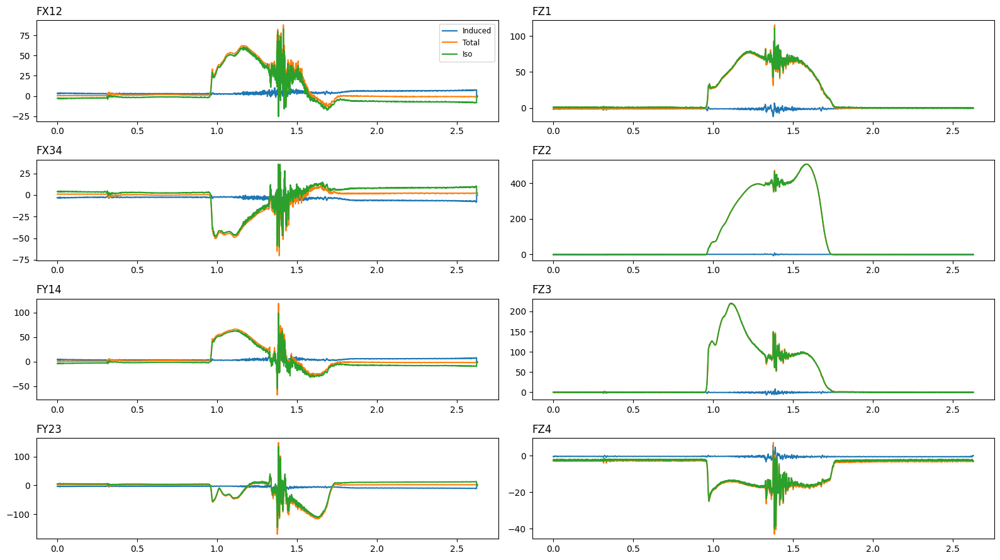

In [25]:
fig = plt.figure(figsize=(16,9), facecolor='white')
fig.subplots_adjust(left=0.05, right=0.95, top=0.92, bottom=0.05, wspace=0.15)
gs = gridspec.GridSpec(4, 2)

ax_fx12 = fig.add_subplot(gs[0, 0])
ax_fx34 = fig.add_subplot(gs[1, 0])
ax_fy14 = fig.add_subplot(gs[2, 0])
ax_fy23 = fig.add_subplot(gs[3, 0])
ax_fz1 = fig.add_subplot(gs[0, 1])
ax_fz2 = fig.add_subplot(gs[1, 1])
ax_fz3 = fig.add_subplot(gs[2, 1])
ax_fz4 = fig.add_subplot(gs[3, 1])

for i, (ax, name) in enumerate(zip(
    [ax_fx12, ax_fx34, ax_fy14, ax_fy23, ax_fz1, ax_fz2, ax_fz3, ax_fz4],
    ['FX12', 'FX34', 'FY14', 'FY23', 'FZ1', 'FZ2', 'FZ3', 'FZ4']
)):
    ax.plot(t_forces, induced_forces[:, i], label='Induced')
    ax.plot(t_forces, trip_forces[:, i], label='Total')
    ax.plot(t_forces, trip_forces_iso[:, i], label='Iso')
    ax.set_title(name, loc='left')
    if i == 0:
        ax.legend(loc='upper right', fontsize='small')

plt.tight_layout()
plt.show()


# Compute Forces/Moments and GRF

In [ ]:
Kist = HexKistler(cluster_hex_static=static_hex_markers)

trip_grf = Kist.process_forces(
    cluster_hex=trip_hex_markers,
    raw_forces=trip_forces_iso
)
corners, sensors = Kist.track_plate()
kist_origin_base = Kist.T_KG_neut[:3, 3]

# Animate Resulting GRF

In [ ]:
anim = animate_grf(
    t=t_forces,
    forces=trip_grf['force'],
    COP=trip_grf['COP'],
    moment_free=trip_grf['moment_free'],
    is_stance=trip_grf['is_stance'],
    corners=corners,
    sensors=sensors,
    kist_origin_base=kist_origin_base,
    side=1,
    markers=trip_bio_markers,
    speed=0.5
)

HTML(anim.to_jshtml())